### Load dataset and extract SentenceTransformers embeddings and prompt categories

In [17]:
import pandas as pd
from collections import Counter

INPUT_FILE = "data/processed/maleficent.csv"
df = pd.read_csv(INPUT_FILE)

embeddings = []
for embedding in df['embedding']:
    temp = [float(x.strip(' []')) for x in embedding.split(',')]
    embeddings.append(temp)

categories = []
for category in df['category']:
    categories.append(category)

print("Vector size:\t\t\t", len(embeddings[0]))
print("Number of embeddings:\t\t", len(embeddings))
print("Number of category entries:\t", len(categories))
category_count = Counter(categories)

for item, count in category_count.items():
    print(f'\t{item}: {count}')

Vector size:			 384
Number of embeddings:		 1496
Number of category entries:	 1496
	conversation: 1402
	jailbreak: 70
	act_as: 24


### Create dictionary mapping each embedding to a unique category value

In [18]:
def get_data_dict(data, labels, verbose=False):
    data_dict = {}

    for i, data_row in enumerate(data):
        label = labels[i]

        if label not in data_dict:
            data_dict[label] = []
        
        data_dict[label].append(data_row)

    data_dict = {k: v for k, v in data_dict.items() if len(v) > 1}

    if verbose:
        for key, value in list(data_dict.items())[:3]:
            print(f"{key}: {value[:2]}")
        print(len(data_dict['conversation']))
        print(len(data_dict['jailbreak']))
        print(len(data_dict['act_as']))

    return data_dict

In [19]:
get_data_dict(embeddings, categories, verbose=True)

conversation: [[0.6487895846366882, -0.17706210911273956, 0.26846253871917725, 0.18905383348464966, -0.33726221323013306, -0.3302522301673889, 0.19196242094039917, 0.31563907861709595, -0.29508668184280396, 0.09558296203613281, 0.08327564597129822, -0.30192962288856506, -0.1834355741739273, -0.030582385137677193, 0.08354801684617996, 0.025754356756806374, -0.09357529878616333, -0.4416128396987915, -0.6328431963920593, -0.12889698147773743, -0.6578927636146545, -0.11932878941297531, -0.3738086521625519, -0.0864822268486023, 0.4625754952430725, 0.1258043497800827, 0.009837444871664047, 0.32809606194496155, -0.3845890462398529, -0.350810706615448, -0.0006223793025128543, -0.13784588873386383, 0.32487356662750244, 0.07625002413988113, 0.005976521410048008, 0.5497534871101379, 0.039890170097351074, -0.23408359289169312, -0.0031182989478111267, 0.02026244066655636, 0.08132883906364441, -0.26453620195388794, 0.1429012417793274, 0.1672365665435791, 0.24232707917690277, -0.17889976501464844, -0

{'conversation': [[0.6487895846366882,
   -0.17706210911273956,
   0.26846253871917725,
   0.18905383348464966,
   -0.33726221323013306,
   -0.3302522301673889,
   0.19196242094039917,
   0.31563907861709595,
   -0.29508668184280396,
   0.09558296203613281,
   0.08327564597129822,
   -0.30192962288856506,
   -0.1834355741739273,
   -0.030582385137677193,
   0.08354801684617996,
   0.025754356756806374,
   -0.09357529878616333,
   -0.4416128396987915,
   -0.6328431963920593,
   -0.12889698147773743,
   -0.6578927636146545,
   -0.11932878941297531,
   -0.3738086521625519,
   -0.0864822268486023,
   0.4625754952430725,
   0.1258043497800827,
   0.009837444871664047,
   0.32809606194496155,
   -0.3845890462398529,
   -0.350810706615448,
   -0.0006223793025128543,
   -0.13784588873386383,
   0.32487356662750244,
   0.07625002413988113,
   0.005976521410048008,
   0.5497534871101379,
   0.039890170097351074,
   -0.23408359289169312,
   -0.0031182989478111267,
   0.02026244066655636,
   0.081

Demonstrate dictionary structure



### Load data for triplet loss

In [20]:
from triplet_dataset import TripletDataset
import torch
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler

test_size = 0.3
random_state = 42


x_train, x_test, y_train, y_test = train_test_split(embeddings, categories, test_size=test_size, stratify=categories, random_state=random_state)

print("whole dataset count: ", Counter(categories))
print("train dataset count: ", Counter(y_train))
print("test dataset count: ", Counter(y_test))
print("least count in train dataset: ", min(Counter(y_train).values()))


counter_y_train = Counter(y_train)

sampling_strategy = {'conversation': counter_y_train['jailbreak'], 'jailbreak': counter_y_train['jailbreak'], 'act_as': counter_y_train['act_as']}
rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
x_train_resampled, y_train_resampled = rus.fit_resample(x_train, y_train)

print("balanced dataset count: ", Counter(y_train_resampled))

data_dict_train = get_data_dict(x_train_resampled, y_train_resampled, verbose=True)
# print(len(x_train), len(x_test), len(x_train) + len(x_test))
# print(len(y_train), len(y_test), len(y_train) + len(y_test))


siamese_dataset_train = TripletDataset(data_dict_train, False)

# Load the training dataset
num_workers = 4
batch_size = 1800
train_dataloader = DataLoader(
    siamese_dataset_train, shuffle=True, num_workers=num_workers, batch_size=batch_size
)



Counter({'conversation': 1402, 'jailbreak': 70, 'act_as': 24})
Counter({'conversation': 981, 'jailbreak': 49, 'act_as': 17})
Counter({'conversation': 421, 'jailbreak': 21, 'act_as': 7})
17
Counter({'conversation': 49, 'jailbreak': 49, 'act_as': 17})
act_as: [[0.08930853009223938, 0.05926555022597313, 0.15495863556861877, 0.04387298598885536, -0.25390660762786865, -0.19516442716121674, 0.20538944005966187, 0.11100132018327713, -0.20118001103401184, 0.08526986092329025, 0.18840795755386353, -0.3486308753490448, -0.02092673070728779, -0.12096866220235825, -0.007458238396793604, 0.12017478793859482, -0.013256960548460484, 0.264727920293808, -0.3599710762500763, -0.1584392935037613, -0.11510510742664337, 0.13767200708389282, -0.22056497633457184, 0.04890817031264305, -0.097864530980587, -0.038795702159404755, 0.26392191648483276, 0.06834207475185394, -0.028036925941705704, -0.20318077504634857, -0.050746627151966095, -0.010404432192444801, 0.431837797164917, 0.09155910462141037, -0.15264469

### Initialize siamese network

In [21]:
from torch import optim
import torch.nn as nn

from siamese_network import SiameseNetwork

embedding_dim = 128

siamese_net = SiameseNetwork(embedding_dim).cuda()
margin = 0.3
criterion = nn.TripletMarginLoss(margin=margin)

learning_rate = 0.0001
optimizer = optim.Adam(siamese_net.parameters(), lr=learning_rate)

n_epochs = 200

print(siamese_net)
print(f"Number of epochs: {n_epochs}")
print(f"Embedding dimension: {embedding_dim}")
print(f"Optimizer: Adam")
print(f"Learning rate: {learning_rate}")
print(f"Loss function: TripletMarginLoss")
print(f"Margin: {margin}")
print(f"Batch size: {batch_size}")
print(f"Number of workers: {num_workers}")
print(f"Dataset: {INPUT_FILE}")
print(f"Number of classes: {3}")
print(f"Number of samples: {len(siamese_dataset_train)}")

SiameseNetwork(
  (embedding): Sequential(
    (0): Linear(in_features=384, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=512, out_features=256, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=256, out_features=128, bias=True)
  )
)
Number of epochs: 200
Embedding dimension: 128
Optimizer: Adam
Learning rate: 0.0001
Loss function: TripletMarginLoss
Margin: 0.3
Batch size: 1800
Number of workers: 4
Dataset: data/processed/maleficent.csv
Number of classes: 3
Number of samples: 115


In [22]:
def train(n_epochs, model, optimizer, criterion):
    global train_dataloader
    best_loss = float("inf")
    best_state = None
    iteration_number = 0
    counter = []
    loss_history = []

    for epoch in range(n_epochs):
        # Iterate over batches
        for i, (anchor, positive, negative) in enumerate(train_dataloader, 0):
            # Send the images to CUDA
            anchor, positive, negative = anchor.cuda(), positive.cuda(), negative.cuda()

            # Zero the gradients
            optimizer.zero_grad()

            # Pass in the anchor, positive, and negative images into the network
            output_anchor, output_positive, output_negative = model(anchor, positive, negative)

            # Compute the triplet loss
            loss_triplet = criterion(output_anchor, output_positive, output_negative)

            # If the validation loss is at a minimum
            if loss_triplet < best_loss:
                best_loss = loss_triplet
                best_state = model.state_dict()

            # Backpropagation
            loss_triplet.backward()

            # Optimize
            optimizer.step()

            # Every 10 batches print out the loss
            if i % 10 == 0:
                print(f"Epoch number {epoch}\n Current loss {loss_triplet.item()}\n")
                iteration_number += 10

                counter.append(iteration_number)
                loss_history.append(loss_triplet.item())

    print("Training finished")
    # print(counter)
    # print(loss_history)
    return counter, loss_history, best_state, best_loss

In [23]:
import matplotlib.pyplot as plt

def show_plot(iteration, loss):
    plt.plot(iteration, loss)
    plt.show()

### Train siamese network and log metrics

In [24]:
%%time
import time
from datetime import datetime

start_time = time.time()
# Training
counter, loss_history, best_state, best_loss = train(n_epochs, siamese_net, optimizer, criterion)
end_time = time.time()
execution_time = end_time - start_time

minutes, seconds = divmod(execution_time, 60)

Epoch number 0
 Current loss 0.27415886521339417

Epoch number 1
 Current loss 0.277299702167511

Epoch number 2
 Current loss 0.2670782506465912

Epoch number 3
 Current loss 0.25829681754112244

Epoch number 4
 Current loss 0.2562309205532074

Epoch number 5
 Current loss 0.24610386788845062

Epoch number 6
 Current loss 0.2286876142024994

Epoch number 7
 Current loss 0.22411300241947174

Epoch number 8
 Current loss 0.2278289645910263

Epoch number 9
 Current loss 0.20894505083560944

Epoch number 10
 Current loss 0.1959725022315979

Epoch number 11
 Current loss 0.18401212990283966

Epoch number 12
 Current loss 0.15314428508281708

Epoch number 13
 Current loss 0.1384565234184265

Epoch number 14
 Current loss 0.14891883730888367

Epoch number 15
 Current loss 0.1151612251996994

Epoch number 16
 Current loss 0.1116950660943985

Epoch number 17
 Current loss 0.09002607315778732

Epoch number 18
 Current loss 0.08332069963216782

Epoch number 19
 Current loss 0.08743523061275482



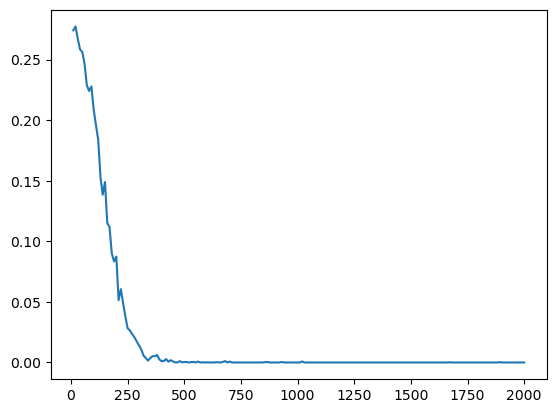

In [25]:
show_plot(counter, loss_history)

In [26]:
print(best_loss)

tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)


### Save model

In [27]:
from datetime import datetime
import os
import torch

now = datetime.now().strftime("%d-%m-%Y_%H-%M-%S")

# create folder
model_dir = f"trained_split_balanced/{now}"
os.makedirs(model_dir, exist_ok=True)
# Save the trained model
torch.save(siamese_net.state_dict(), os.path.join(model_dir, "state.pth"))

# Save the best state
torch.save(best_state, os.path.join(model_dir, f"best_state-{best_loss}.pth"))

torch.save(siamese_net, os.path.join(model_dir, "model.pth"))
with open(os.path.join(model_dir, "Architecture.txt"), "w") as f:
    f.write(str(siamese_net))
    f.write(f"\nExecution time: {int(minutes)} minutes and {seconds:.2f} seconds\n")
    f.write(f"Number of epochs: {n_epochs}\n")
    f.write(f"Embedding dimension: {embedding_dim}\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Learning rate: {learning_rate}\n")
    f.write(f"Loss function: TripletMarginLoss\n")
    f.write(f"Margin: {margin}\n")
    f.write(f"Batch size: {batch_size}\n")
    f.write(f"Number of workers: {num_workers}\n")
    f.write(f"Dataset: {INPUT_FILE}\n")
    f.write(f"Number of classes: {len(data_dict_train)}\n")
    f.write(f"Number of samples: {len(siamese_dataset_train)}\n")
    f.write(f"Test size: {test_size}\n")
    f.write(f"Data split seed: {random_state}\n")

In [28]:
import torch

malicious_model = torch.load(os.path.join(model_dir, "model.pth"))

### Evaluate best threshold and AUC

In [29]:
import importlib
import roc_curve
importlib.reload(roc_curve)

fpr, tpr, roc_auc, best_threshold = roc_curve.main(malicious_model, plot=True, folder=model_dir)
print(f"Best threshold: {best_threshold}")
print(f"AUC: {roc_auc}")

Vector size:			 384
Number of embeddings:		 1496
Number of category entries:	 1496
Best threshold: 0.9300074734475728
AUC: 0.9870997600000001
